<a href="https://colab.research.google.com/github/Vale864/Causal_Impact_Airline_Fare/blob/main/airline_readme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')
print("✅ Google Drive mounted successfully.")

from IPython.display import Image, display

Mounted at /content/drive
✅ Google Drive mounted successfully.


# Causal Impact of Deltas Basic Economy Fare Class on Airline Market Dynamics

# Project Summary: TL;DR Version

### 📌 Project Overview
In 2012, Delta Airlines introduced "Basic Economy" fares—a restrictive fare class designed to compete with low-cost carriers like Spirit and Frontier without cannibalizing premium revenue.

This project uses **Bayesian Causal Inference** to quantify the impact of this strategic decision on Delta's KPIs: yield, market share, and revenue. Unlike a standard A/B test, this policy was rolled out widely, making it an observational study requiring rigorous counterfactual modeling.

### ⭐️ STAR Breakdown

* **Situation:** The airline industry faced a paradigm shift in 2012 as legacy carriers struggled to compete with Low-Cost Carriers (LCCs) on price. Delta needed a way to segment price-sensitive customers without lowering prices across the board.
* **Task:** My goal was to determine if the introduction of Basic Economy caused a statistically significant increase in the KPIs, or if observed growth was simply due to external market factors (e.g., post-recession recovery).
* **Action:**
    * **Data Engineering:** Extracted and cleaned historical flight data from the US Department of Transportation's **DB1B (Airline Origin and Destination Survey)** dataset.
    * **Modeling:** Implemented a **Bayesian Structural Time Series (BSTS)** and **Multivariate Synthetic Control (SCM)** model using **PyMC**.
    * **Counterfactuals:**
      * For the SCM, a synthetic control group was used to create a weighted combination of competitor metrics (airlines that did not introduce Basic Economy at that time) to predict what Delta's KPIs *would have been* without the policy.
      * For the BSTS, instead of creating a synthetic control from other routes, it creates a counterfactual solely based on the carrier's own pre-treatment history.

* **Result:** The models demonstrated a clear divergence between the actual observed KPIs and the counterfactuals, indicating a positive causal effect attributable to the segmentation strategy. Additionally, the BSTS model demonstrates how the strategy successfully rebuffed the low-cost carriers' encroachment into Delta's share of the market.

### 🛠 Tech Stack
* **Language:** Python 3.10+
* **Libraries:** PyMC, ArviZ, Pandas, NumPy, Matplotlib/Seaborn
* **Data Source:** US DOT DB1B Market Data

### 🧠 Methodology Note
Why **PyMC**? Standard regression techniques often fail to account for the temporal structure and evolving variance of airline data. By using a Bayesian approach, I was able to generate **Credible Intervals** (uncertainty bands) around the impact estimates, providing a more robust risk assessment than simple point estimates.

---
*Author: Austin Woolston*
*Connect with me on [LinkedIn](https://www.linkedin.com/in/austin-woolston-0a3a1a255/)*

---

# Project Summary: Detailed Version

## Project Motivation

**Brief Introduction to Causal Inference**

It may be helpful to contextualize Causal Inference (CI) within the broader landscape of data science. Think of CI as occupying a space on a sliding scale of methods we can use to answer the age-old question of how changes in one variable influence another. On the far left are less robust but easy-to-implement methods, like basic associative statistics. On the far right are robust but operationally difficult methods, like the Randomized Controlled Trial (RCT). CI sits somewhere in the middle. This analogy helps us think strategically about the methods we deploy, as there are often diminishing returns to the benefits we receive in either direction.

One does not simply make a causal claim. The ideal way to determine the effect of an intervention, such as smoking, on a population would be to simulate a parallel reality that perfectly matches this one, with the only difference being that the roles of smokers and non-smokers are swapped. In causal theory, this is known as the "Fundamental Problem of Causal Inference"—we simply cannot observe the counterfactual.

While RCTs are the gold standard for canceling out these differences, they are often costly, infeasible, or unethical to implement (e.g., randomly assigning people to smoke). This is where CI steps in. It allows us to simulate that "parallel reality" using a formalized language and domain knowledge. It uses tools like Directed Acyclic Graphs (DAGs) or Structural Equation Models (SEMs) to represent the Data Generating Process (DGP), and by making strong, transparent assumptions, we can infer causality without an RCT.

**Prediction vs. Causation**

A large amount of contemporary data science and machine learning (ML) relies on correlations to form predictions. However, relying solely on correlations is, as I’ve heard it described, "effectively driving by looking in the rearview mirror." The model can tell you what is likely to happen, but it cannot tell you how to change that outcome. CI attempts to answer a deeper set of questions: it is not concerned with what will happen, but what would happen if an intervention were made. It is the science of estimating the real effect of an action.

**The Human Element**

In theory, this sounds great, but the necessary assumptions, diagrams, and domain knowledge introduce a layer of methodological rigor and complexity. There is no `sklearn.fit().predict()` equivalent for causal inference; it cannot be easily automated. This substantial methodological investment, however, is precisely where its value lies.

One of the biggest friction points in data science is the translation of value between technical teams and decision-makers. CI helps ameliorate this friction by leveraging the preexisting condition that humans share a common language: thinking causally. It is much easier to walk a stakeholder through a causal diagram than to explain why they should trust the weights of a neural network. This transparency helps break down the language barrier, allowing expert domain knowledge to flow into the models.

My choice of PyMC for this project was made with this idea in mind, as it also harnesses the synergy between data science and domain expertise. By incorporating a Bayesian framework into causal inference, I can use domain expertise to form "priors," explicitly mathematically encoding business knowledge into the model.

**Strategic Value**

As prediction itself becomes commoditized—with platforms like AutoML becoming increasingly sophisticated—the ability to spin up predictive models in minutes is becoming less of a differentiator. When the "what" of prediction becomes automated, the "why" of causation becomes the domain where human intelligence, domain expertise, and rigorous statistical thinking drive value creation.

**Why This Project?**

With that context established, we can look at why I chose this specific project.

Before starting, I had a keen interest in causal inference but limited practical experience. I also have a background in Economics, where one of my favorite courses was Industrial Organization. Understanding how firms compete is a complex, high-stakes problem that deserves attention.

I noticed that many causal inference applications I was encountering focused on areas like marketing (e.g., ad lift) or epidemiology. It occurred to me that CI might be suitable for gaining insights into the opaque, dynamic game of market competition. So I decided to explore its application in a less mainstream domain: competitive intelligence.

I chose to investigate the airline industry—a highly competitive and data-rich environment—to measure the real-world impact of a major strategic decision: Delta Air Lines' introduction of the "Basic Economy" fare. This scenario provided the perfect natural experiment to test how effective CI methods can be at dealing with strategic competitive analysis.

Recognizing that a full causal map of a dynamic competitive game is infeasible for a solo project, I deliberately scoped the analysis. **My aim is not to untangle every latent causal relationship, but to rigorously evaluate the practical effectiveness of modern CI techniques (Synthetic Control, BSTS) against a high-stakes, real-world competitive event.** This demonstrates a crucial skill: the ability to select and apply powerful statistical tools appropriate to the complexity and data constraints of a real-world business problem.

## Project Overview & Methodology

This project uses causal inference techniques to measure the impact of Delta Air Lines' (DL) Basic Economy fare introduction in 2012-Q1 on two primary Key Performance Indicators (KPIs): Market Share and Passenger Yield (pricing power).

The analysis is a two-part study:

1. **Multivariate Synthetic Control (SCM):** A Bayesian synthetic control model is used to create a "synthetic" version of Delta's treated routes (DTW to Florida) from a donor pool of similar, untreated routes operated by legacy competitors (American Airlines and US Airways). This allows for a robust estimation of the causal impact on both KPIs simultaneously.

2. **Bayesian Counterfactual Trend Analysis:** An in-depth analysis of the key DTW-FLL route. This hierarchical Bayesian model estimates a counterfactual trend for Delta’s and its main competitor Spirit’s revenue by fare quantile, providing a more detailed view of how the introduction of Basic Economy fares affected the market structure.


## 1. Data Sourcing & Preparation

**It is important to note that the DB1B dataset is limited to quarterly intervals. This level of aggregation restricts the analysis’s precision and naturally raises the uncertainty in the time-series estimates.**

### 1.1 Data Source: DB1B

The core dataset for this project is the Airline Origin and Destination Survey (DB1B) from the Bureau of Transportation and Statistics (BTS). This is a 10% random sample of all domestic airline tickets. For this analysis, the DB1B Market table was used, as it provides aggregated data for each carrier on a specific route (Origin-Destination) for each quarter.

I found the following academic research paper that investigated the data quality of DB1B. Its also a good place to start if your looking to learn more about the data in general.

- https://backoffice.biblio.ugent.be/download/8634552/8639445

While the DB1B is a premier, publicly available source, it has known data quality issues. A key finding from that academic research paper is that while inconsistencies exist, "this is somewhat less pronounced for important routes and airports," which supports its use for this study of high-volume Delta hub routes.


### 1.2 Data Cleaning & Merger Recoding

A significant part of the data preparation (detailed in the airline_db1b_data.ipynb notebook) involved cleaning and standardizing the carrier data. The study period (2008-2014) was a time of massive consolidation in the US airline industry. To create consistent time-series data for "carriers" as economic entities, data from merged airlines was recoded to the acquiring carrier starting from the quarter of the merger's closing date.This prevents treating two merging carriers as competitors when they were, for all economic and pricing purposes, a single enterprise.

| Merger | Announcement Date | Regulatory Approval Date | Closing Date | Single Operating Certificate (SOC) Date | Official DB1B Joint Reporting Date |
|:---|:---|:---|:---|:---|:---|
| Delta & Northwest | April 14, 2008 | October 29, 2008 | October 29, 2008 | December 31, 2009 | January 2010 |
| United & Continental | May 3, 2010 | August 27, 2010 | October 1, 2010 | November 30, 2011 | January 2012 |
| Southwest & AirTran | September 27, 2010 | April 26, 2011 | May 2, 2011 | March 1, 2012 | January 2015 |
| American & US Airways | February 14, 2013 | November 12, 2013 | December 9, 2013 | April 8, 2015 | July 2015 |

## 2. Key Performance Indicators (KPIs)

To measure the policy's impact, two primary KPIs were constructed for each carrier-route-quarter:

### 2.1 Market Share

This measures a carrier's competitive dominance and passenger volume on a route. It is calculated as the ratio of a carrier's total passengers to the total passengers of all carriers in that market for that quarter. For the SCM model, this KPI is transformed using a Logit function (Logit_Market_Share) to map the [0, 1] bounded share to a normal distribution.

$$\text{Market Share}_{crq} = \frac{\text{Passengers}_{crq}}{\sum_{i \in C} (\text{Passengers}_{irq})}$$

### 2.2 Yield

This measures a carrier's pricing power. It represents the average revenue earned per passenger mile. It is calculated as the total market fare revenue divided by the total market miles flown for that carrier-route-quarter. For the SCM model, this KPI is transformed using a Natural Log (Log_Yield) to stabilize variance and handle its positive-only nature.

$$\text{Yield}_{crq} = \frac{\text{Total Revenue}_{crq}}{\text{Total Miles}_{crq}}$$

## 3. Analysis 1: Bayesian Counterfactual Trend Analysis

The first analysis, detailed in **airline_counterfactual_trend.ipynb**, performs a granular look into one of the most competitive routes, DTW-FLL, to see how the fare structure was affected.

### 3.1 Objective

This analysis compares Delta (DL), the treated carrier, with its primary Ultra-Low-Cost-Carrier (ULCC) competitor, Spirit Airlines (NK), on the DTW-FLL route. The goal is to estimate what Delta's and Spirit's revenue trend would have been without Basic Economy.

Notably, Delta called its basic economy fare the “Spirit-match fare” during an earnings call in 2015. This term recognizes that Delta’s basic economy move was aimed at competing with fares of ultra-low-cost carriers like Spirit Airlines.

### 3.2 Methodology

This model uses a different approach. Instead of creating a synthetic control from other routes, it creates a counterfactual based on the carriers own pre-treatment history.

1. Data: The dtw_fll_df is aggregated into 10 deciles (Quantiles 0-9) based on the yield of the market for each quarter. These 10 quantiles represent an approximation of the market fare structure for each quarter. By totaling the yield for each carrier's contribution to each quantile, we get `Market_Quantile_Revenue_sum`. In other words, total revenue earned per passenger per mile for each carrier in each of the market level quantiles.

2. Model: A hierarchical Bayesian model is built in PyMC to model the revenue in each of the 10 quantiles. The model estimates a linear_trend, a seasonal effect (quarter_mu), and a baseline for each quantile (quantile_mu).

3. Counterfactual: The model is trained only on the pre-treatment data (2008-Q4 to 2011-Q4). It is then used to predict the revenue for the post-treatment period (2012-Q1 to 2014-Q2). This prediction serves as the "counterfactual trend."

4. Impact: The causal impact is calculated as the difference between the actual observed revenue and the predicted counterfactual revenue for each quantile, providing a rich, detailed view of the policy's effect across the entire fare ladder.

### 3.3 Route Selection
The DTW-FLL route was selected out of Delta's test routes for this analysis based on two strategic criteria:

1. **High Leisure Volume:** As a primary leisure destination, this route exhibits high price elasticity. This maximizes the probability of detecting a measurable effect from the introduction of the 'Basic Economy' fare class.

2. **Competitive Isolation:** The route had a stable competitive landscape during the observation period. This minimizes the risk of confounding results from external industry shocks, such as the integration of Southwest Airlines and AirTran Airways (May 2011), which heavily impacted other routes.

## 4. Analysis 2: Multivariate Synthetic Control (SCM)

The second analysis, detailed in **airline_synthetic_control.ipynb**, estimates the average treatment effect on the treated (ATT) routes using a Bayesian Synthetic Control method.

### 4.1 Experimental Design

- Treatment Event: The introduction of Delta's "Basic Economy" pilot program.

- Treatment Timing: Historical sources confirm the pilot began in March 13, 2012. For this quarterly analysis, the treatment period is defined as beginning in 2012-Q1 (QuarterID 17).

- Treatment Group: Delta Air Lines (DL) operations on the four specific, high-volume leisure routes targeted by the pilot program:

  - Detroit (DTW) to Fort Lauderdale (FLL)

  - Detroit (DTW) to Orlando (MCO)

  - Detroit (DTW) to Tampa (TPA)

  - Detroit (DTW) to Fort Myers (RSW)

### 4.2 Control Group Selection

Instead of a naively chosen control, a "donor pool" of potential control units was systematically created. This pool consists of routes operated by Delta's main legacy competitors (American Airlines AA and US Airways US) that were structurally similar to the treated routes.

Similarity was based on pre-treatment data (2008-2011) for passenger volume and route distance. The final donor pool consists of 13 control routes, including:

- AA Routes (7): 'DFW-FLL', 'DFW-MCO', 'DFW-TPA', 'FLL-ORD', 'MCO-ORD', 'ORD-RSW', 'ORD-TPA'

- US Routes (6): 'DCA-FLL', 'DCA-TPA', 'FLL-PHL', 'MCO-PHL', 'PHL-RSW', 'PHL-TPA'

### 4.3 Model Methodology

A Multivariate Bayesian Synthetic Control Model was built using PyMC. This model estimates the counterfactual for the treated group by learning a set of weights for the control units in the donor pool.

This approach is superior to traditional SCM as it:

1. Models KPIs Jointly: It simultaneously creates a synthetic control for both Log_Yield and Logit_Market_Share.

2. Shares Information: The model uses a shared hierarchical prior for the control unit weights (beta_raw_base) but allows for KPI-specific deviations (beta_raw_offset_y, beta_raw_offset_s). This improves accuracy by sharing information about which routes are fundamentally similar.

3. Provides Full Distributions: As a Bayesian model, it provides a full posterior distribution of the causal impact (the "lift" or "loss") for each KPI, rather than just a single point estimate.

## 5. Timeline & Historical Context

This section provides the historical background that defines the quasi-experimental design.

- Start Date: Delta's Basic Economy ("E" class) was released in March 12, 2012. This aligns with the 2012-Q1 treatment start date.

- Test Conclusion Date: While a specific end date for the trial was not publicly announced, evidence indicates the initial test phase concluded and the fare entered a "brief hiatus" during the summer of 2014 (approximately June-August). This date marks the end of the initial "treatment" phase analyzed in this project.

- Strategic Relaunch: After a brief hiatus and analysis period in mid-2014, Delta formally relaunched Basic Economy as a core fare product, effective for travel on or after February 1, 2015.

- Initial Test Markets: The trial was explicitly targeted at routes with significant ultra-low-cost carriers precencence from Detroit (DTW) to four Florida destinations: Orlando (MCO), Tampa (TPA), Fort Myers (RSW), and Fort Lauderdale (FLL).

## 6. Acknowledgements

I am extremely **grateful** for the **open-source community at PyMC** for providing extensive resources in the form of documentation and notebooks on how to leverage their tech stack. Specifically, the methodology for the counterfactual trend model was inspired by the work "Counterfactual inference: calculating excess deaths due to COVID-19" by Benjamin T. Vincent

## Results

### 1. Bayesian Counterfactual Trend Analysis

Before we break out the quantiles, let's take a look at each of the KPIs from the quarterly level.

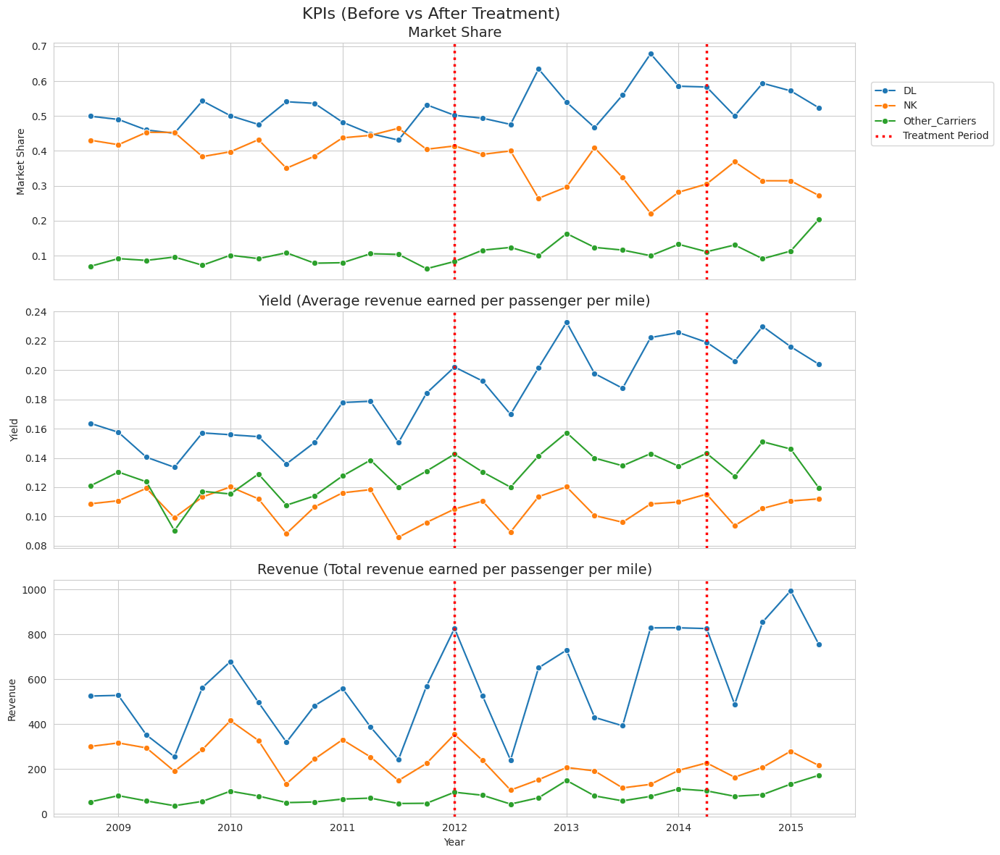

In [2]:

display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/KPIs_Before_After.png'))

`dtw_fll_df` is aggregated into 10 deciles (Quantiles 0-9) based on the yield of the market for each quarter. These 10 quantiles represent an approximation of the market fare structure for each quarter. By totaling the yield for each carrier's contribution to each quantile, we get `Market_Quantile_Revenue_sum`. In other words, total revenue earned per passenger per mile for each carrier in each of the market level quantiles.

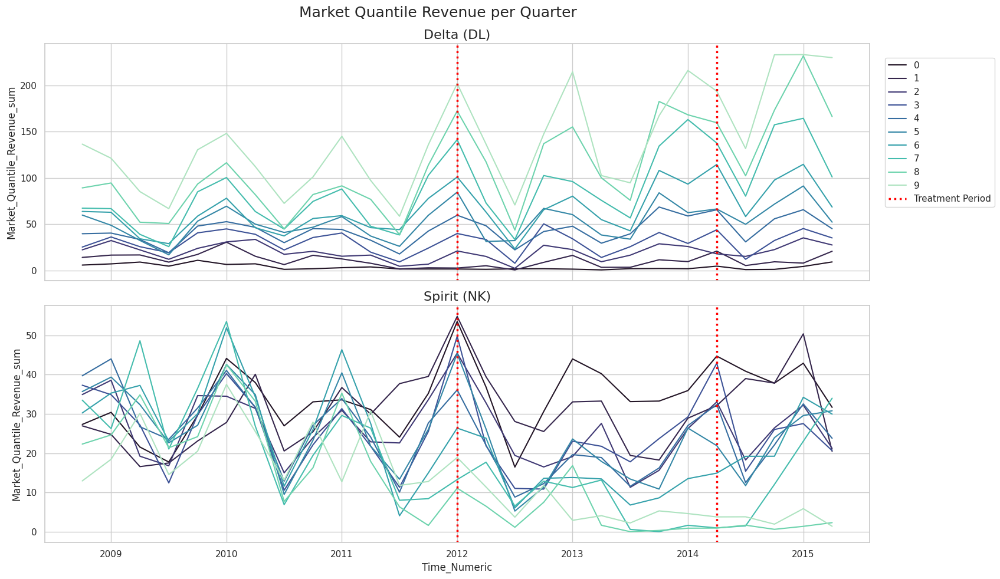

In [3]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Market_Quantile_Revenue.png'))

Here, I find each carrier's individual quantiles of yield and how much revenue each quantile contains:
- `Carrier_Quantile_Revenue_sum`

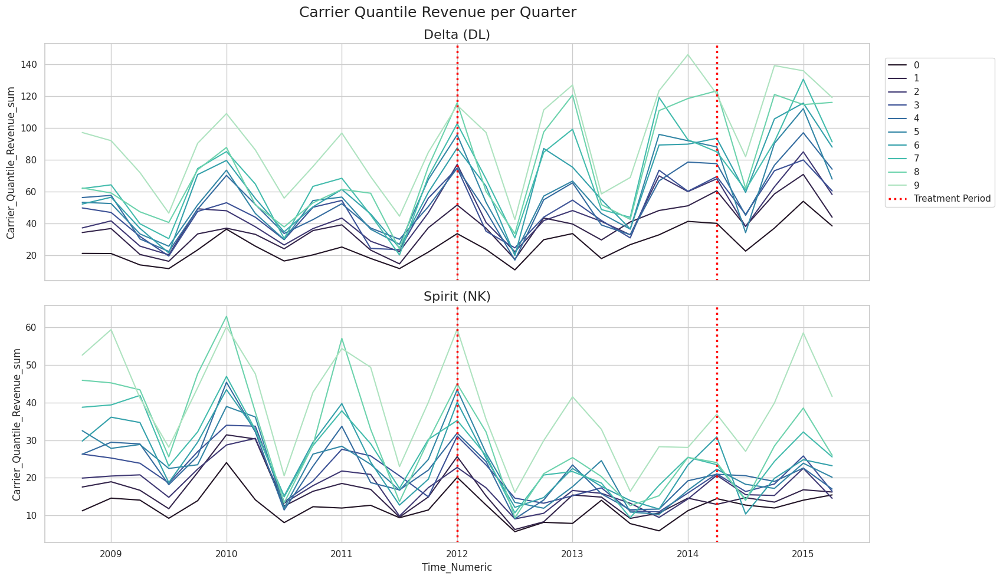

In [4]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Carrier_Quantile_Revenue.png'))

We use `Market_Quantile_Revenue_sum` as our target in the models.

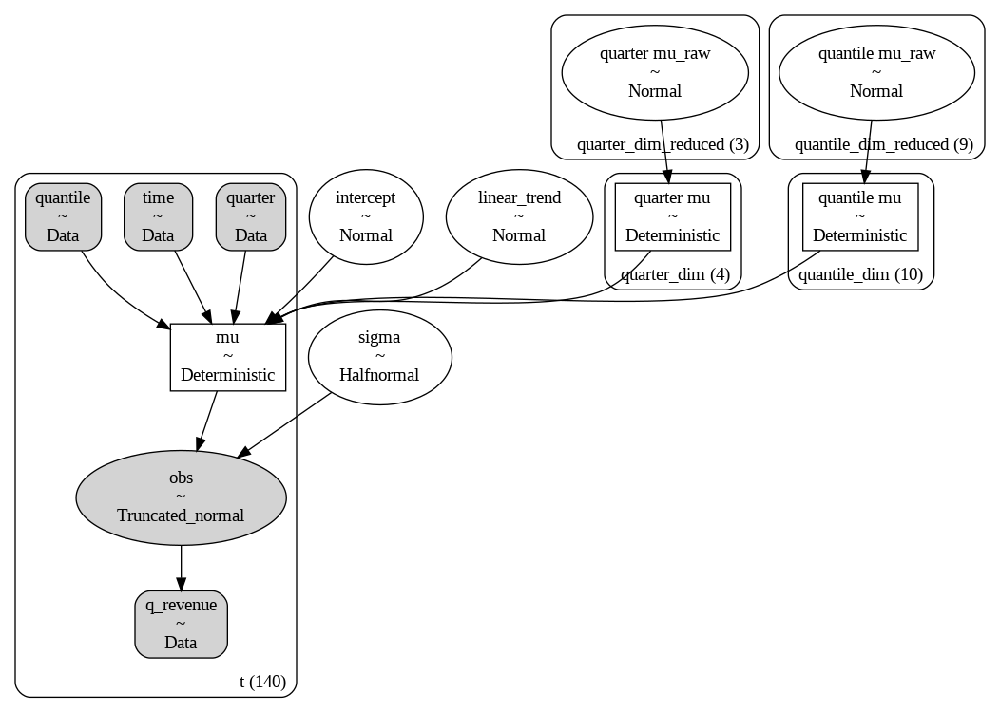

In [5]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_models/dl_model_graph.png'))

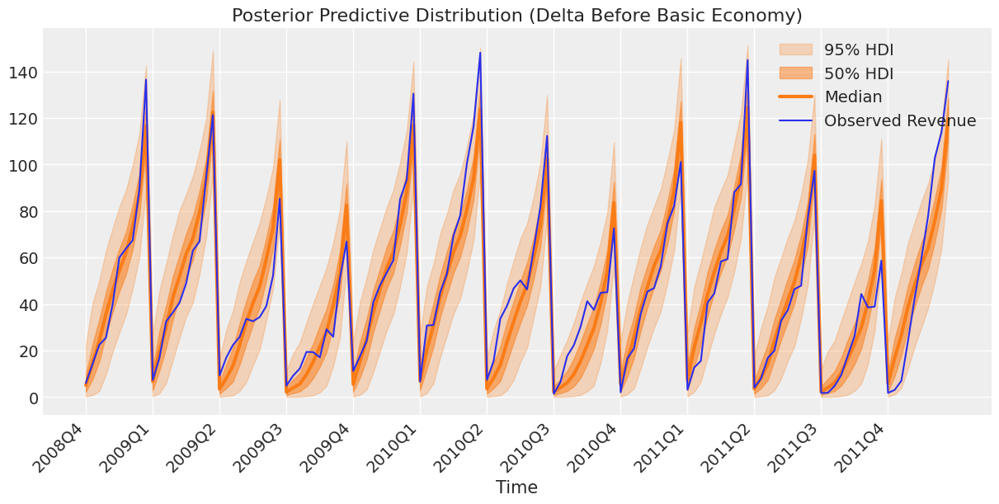

In [6]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Pretreatment_Posterior_Predictive_DL.png'))

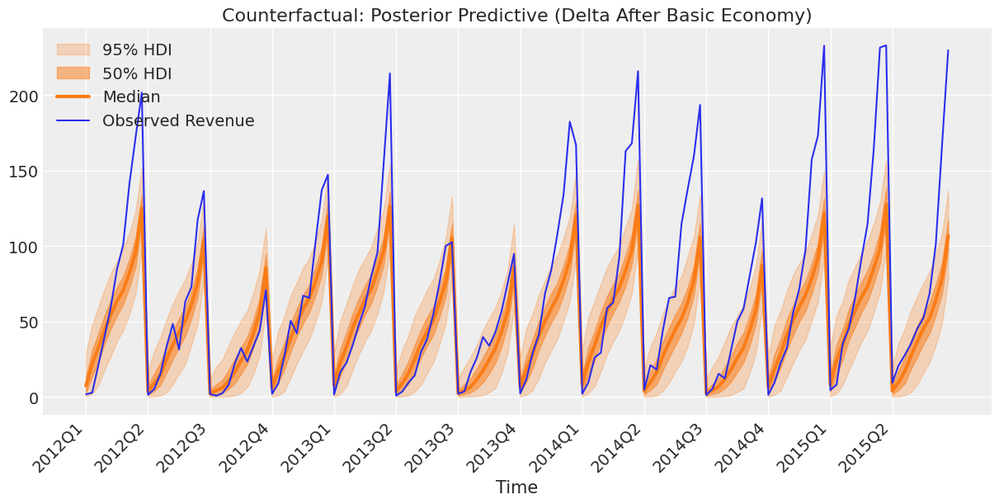

In [7]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Counterfactual_Posterior_Predictive_DL.png'))

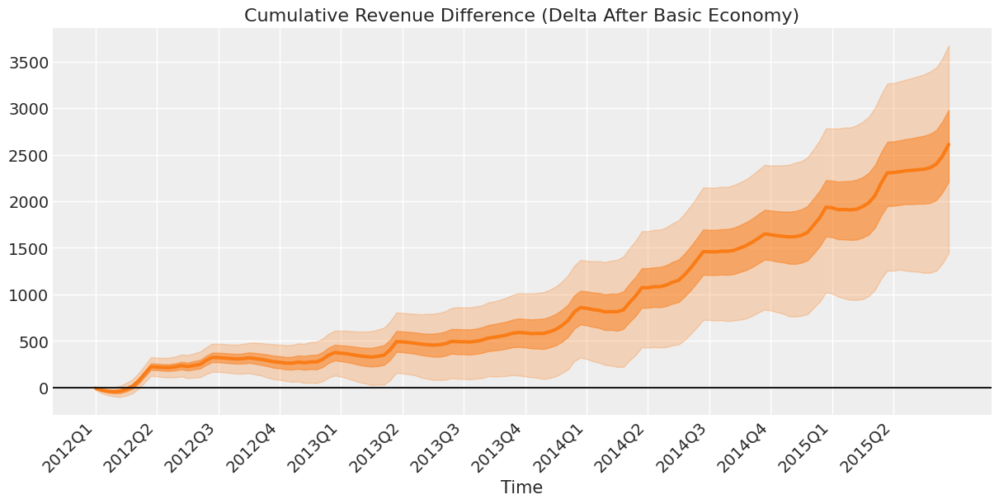

In [8]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Cumulative_Revenue_DL.png'))

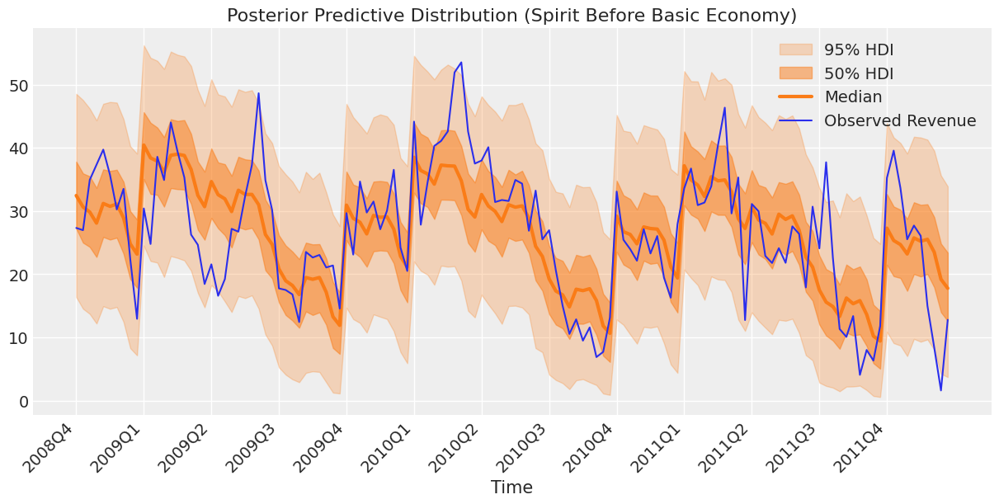

In [9]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Pretreatment_Posterior_Predictive_NK.png'))

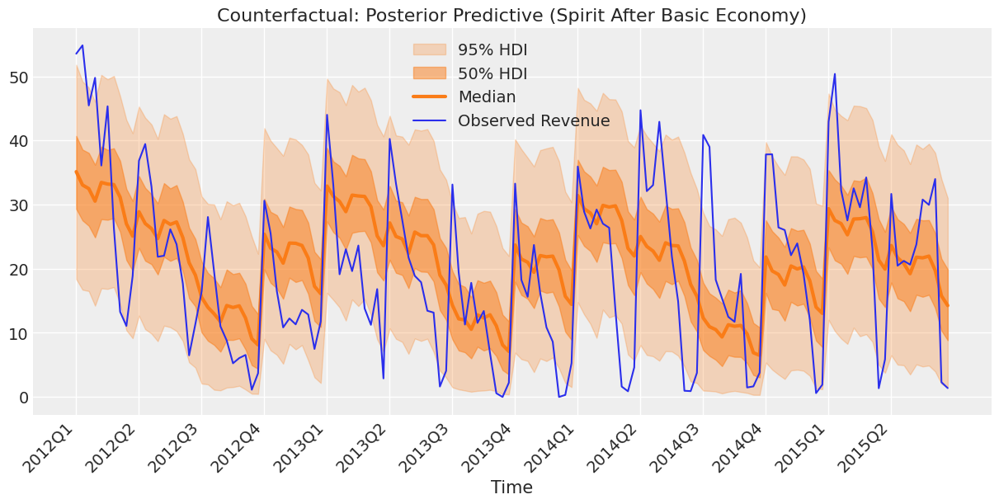

In [10]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Counterfactual_Posterior_Predictive_NK.png'))

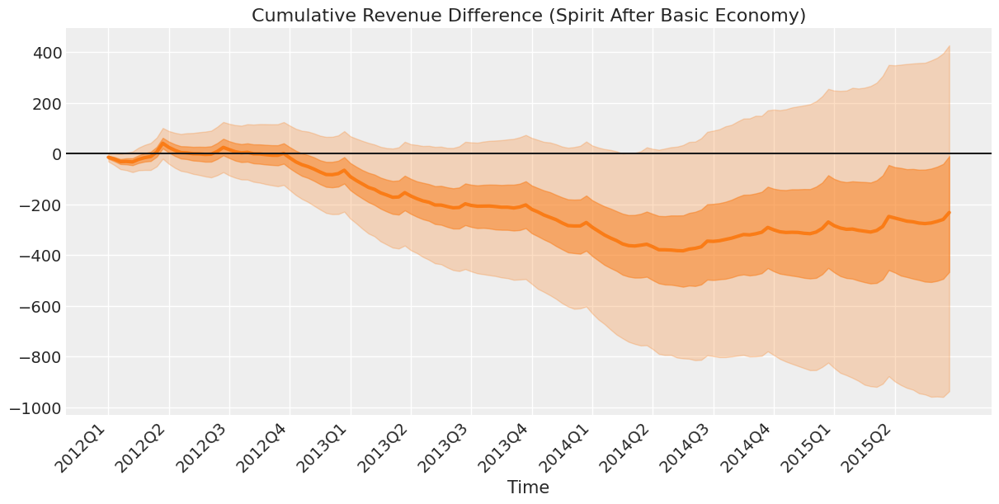

In [11]:
display(Image(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_plots/Cumulative_Revenue_NK.png'))

### 2. Multivariate Synthetic Control (SCM)

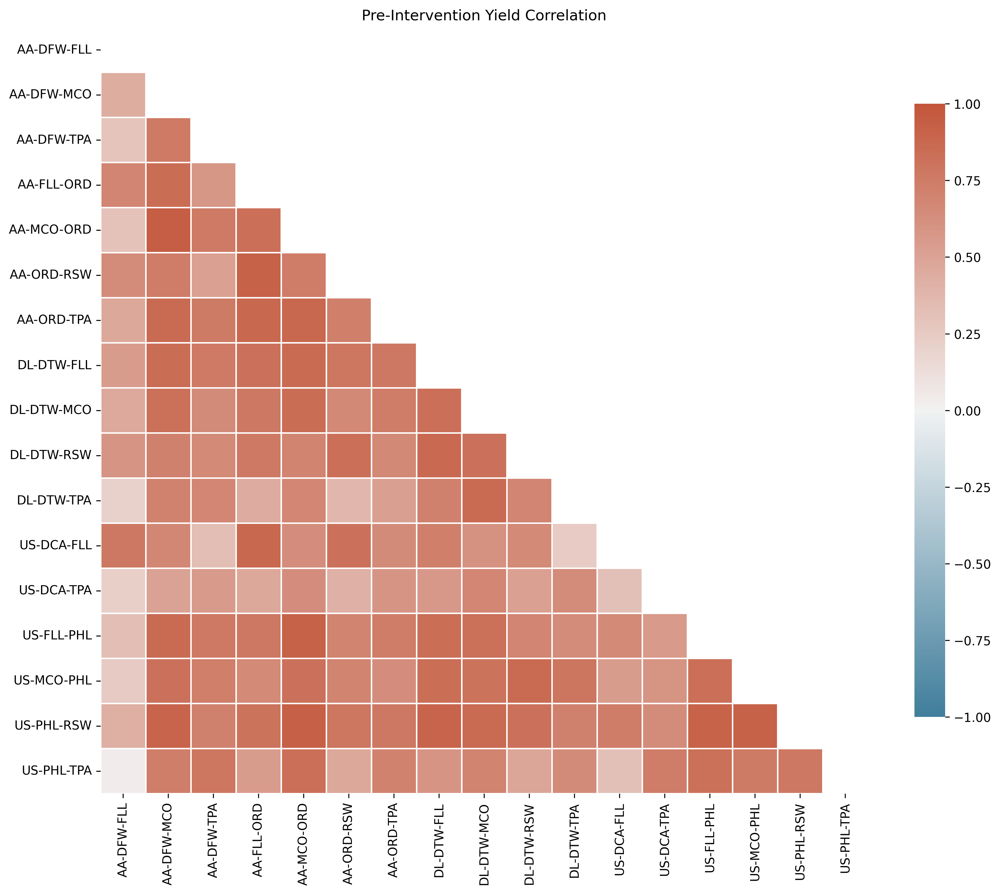

In [12]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/Pre-Intervention_Yield_Correlation.png'))

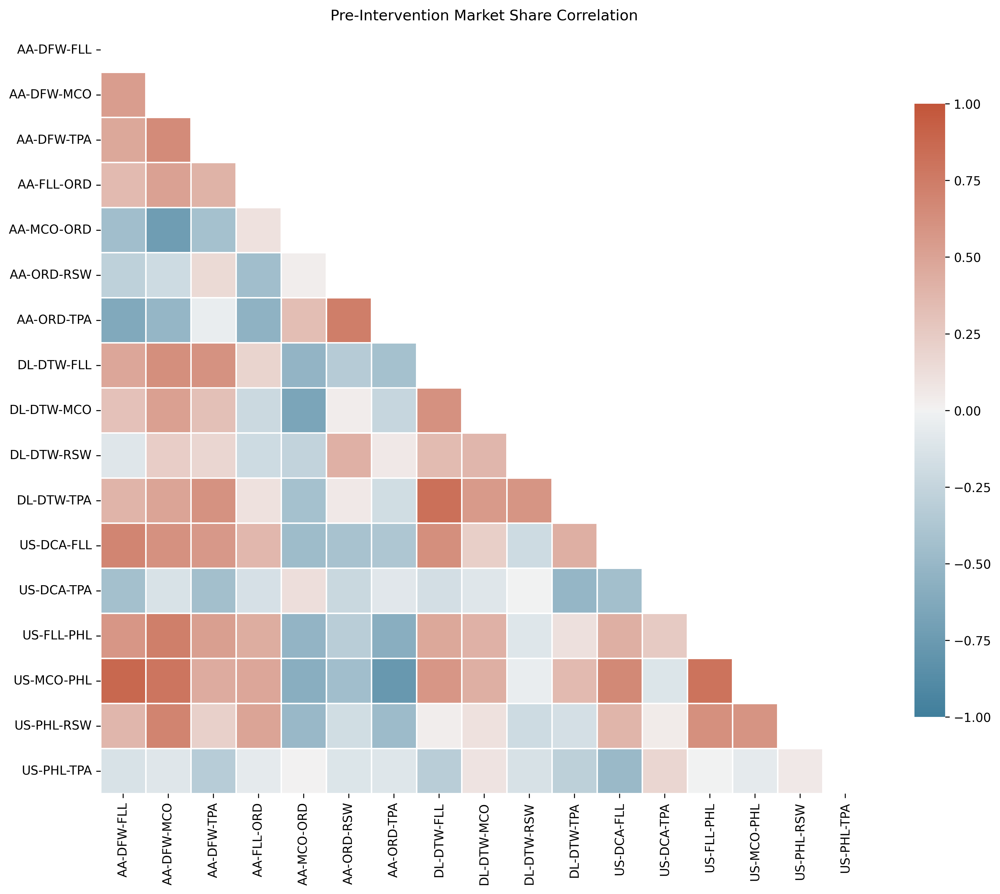

In [13]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/Pre-Intervention_Share_Correlation.png'))

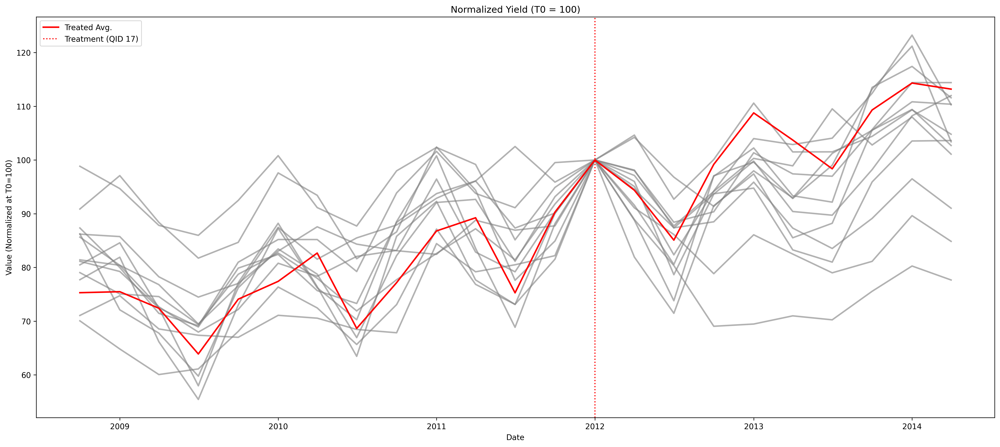

In [14]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/Normalized_Yield_Time_Series.png'))

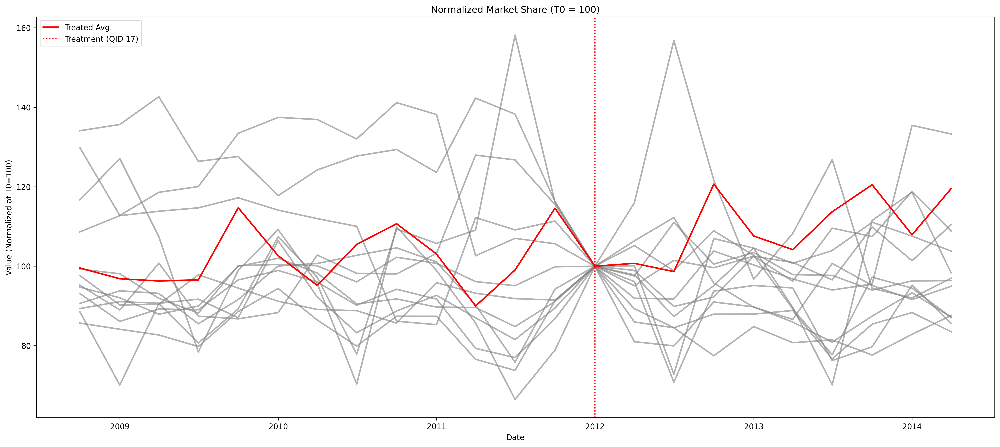

In [15]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/Normalized_Share_Time_Series.png'))

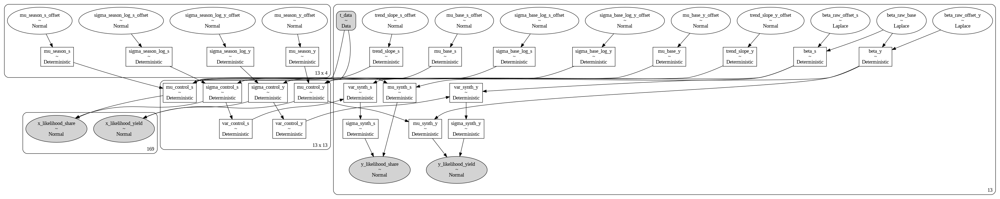

In [16]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_models/scm_model_graph.png'))

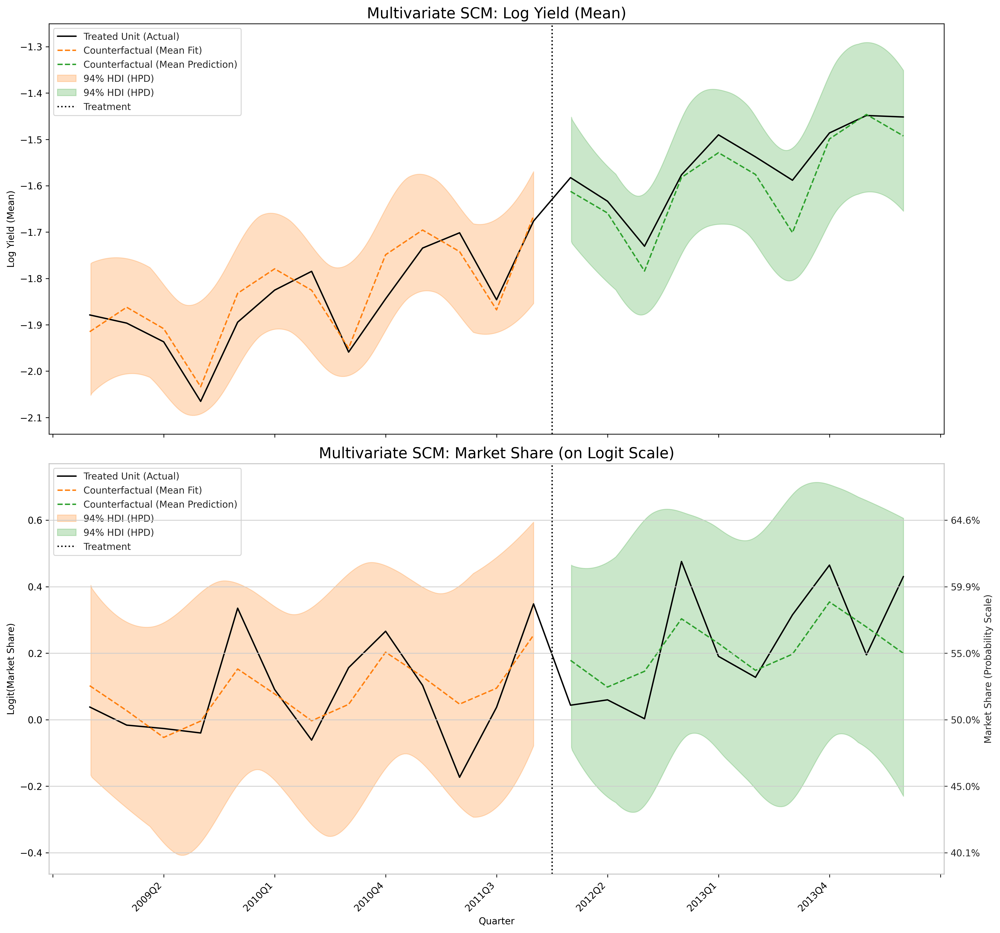

In [17]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/scm_results.png'))

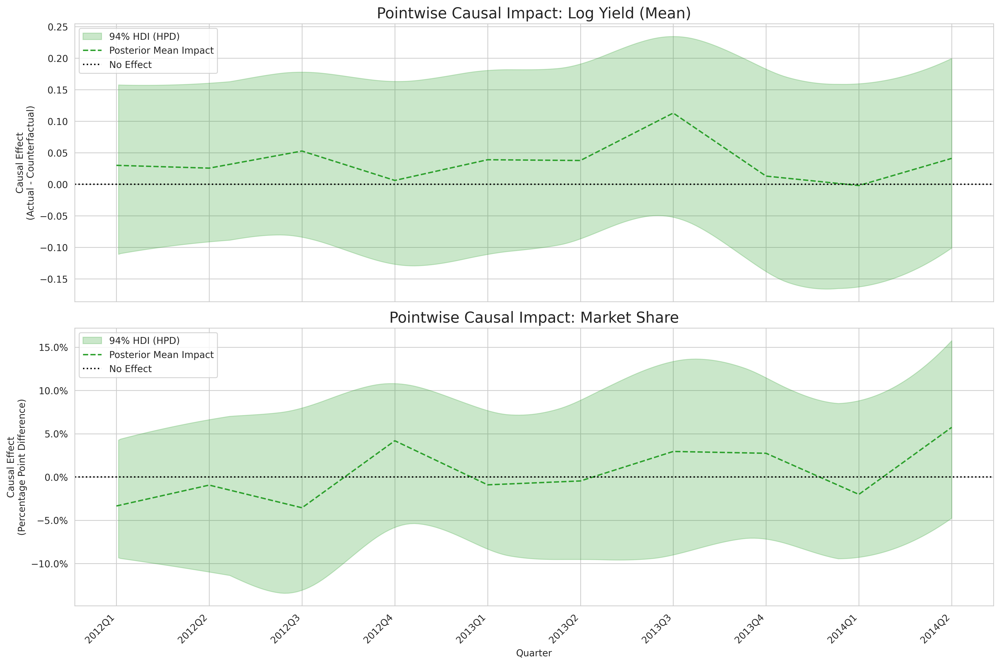

In [18]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/causal_impact.png'))

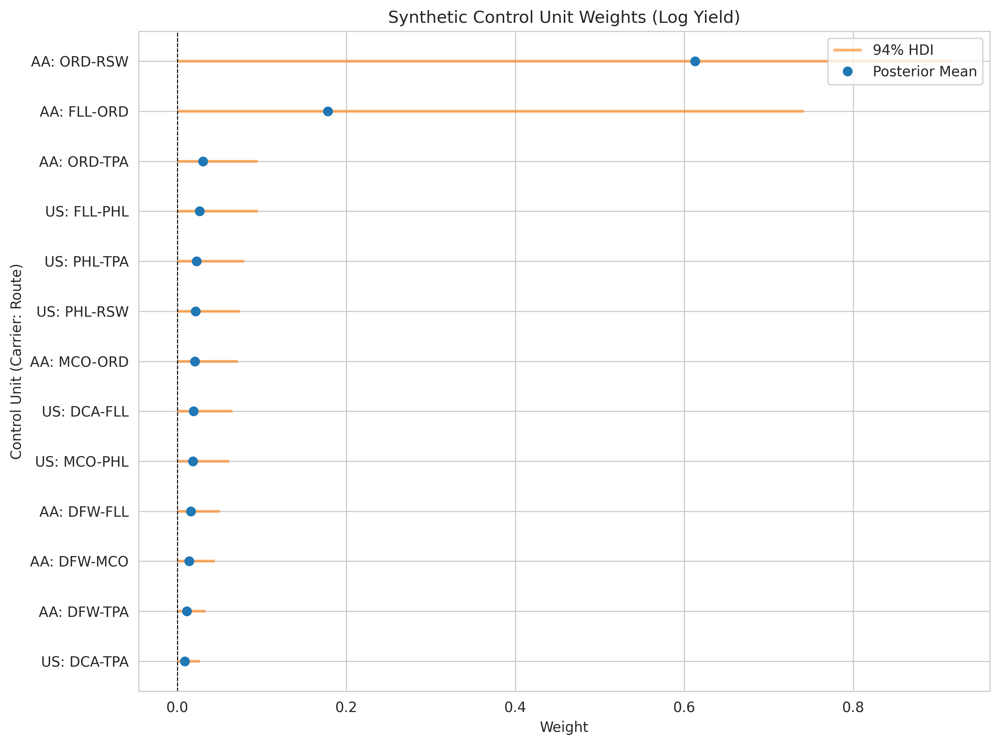

In [19]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/yield_control_weights.png'))

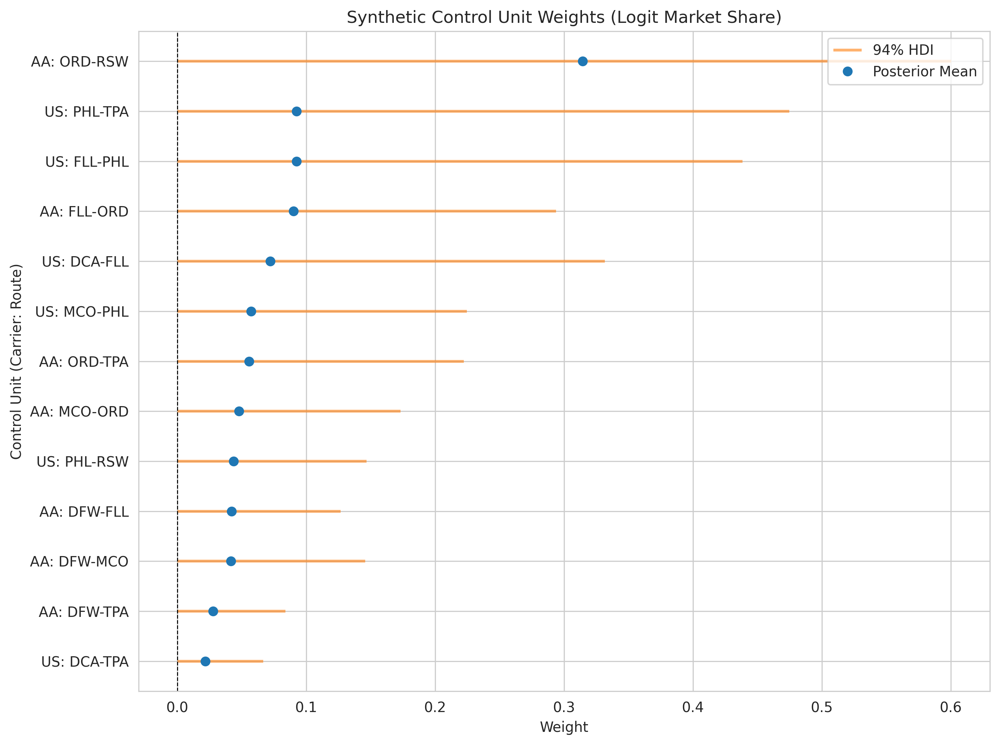

In [20]:
display(Image(filename='/content/drive/MyDrive/AirlineData/scm_plots/share_control_weights.png'))